Aim :

- I'm splitting the data into Cecel and testing it further 

- paramters to use in DESeq 
    - test : Wald 
    - fitype : local
    - parallel  : TRUE 

In [1]:
source("~/Scripts/rosh.lib/da.R")
source("~/Scripts/rosh.lib/playDESeq.R")
suppressPackageStartupMessages( library(calibrate) )
suppressPackageStartupMessages( library("vsn") )

## Get the CountData

#### The count Data is 16s qpcr normalized kegg metagenome prediction 

In [2]:
dpath = "/anas/roshan-current/i2mc/burcelin/Jef/Analysis/picrust_03/kegg_metagenome_prediction.tsv"
ko = read.csv(dpath,  skip=1, sep="\t")
# sort the data based on column names and remname X.OTU.ID to kegg.id
ko = ko %>%
    dplyr::select( X.OTU.ID, starts_with('RSVCUR'), starts_with('RSV'),starts_with('CUR'),starts_with('HFD'),starts_with('NC')) %>%
    dplyr::rename('kegg.ids'= X.OTU.ID)
# make this as a matrix
# rounding of the count data as DESeq2 will trow error
ko.mat = as.matrix( round( ko[,-1] ,0) )
rownames(ko.mat)= ko[,1]

In [3]:
ko.mat[1:5,1:5]

,RSVCUR.TA1,RSVCUR.TA4,RSVCUR.C2,RSVCUR.C7,RSVCUR.TA7
K01365,0,0,0,0,0
K01364,0,0,0,0,0
K01361,2192,11235,0,0,11587
K01360,0,0,0,0,0
K01362,310525,304044,261721,254434,289083


In [4]:
dim(ko.mat)

[1] 3607  115

In [5]:
# There are several rows with no values in the overall dataset [ 502 rows ]
# check for cecal how many empty rows
# prefilter before building DESeq2 object
nrow(ko.mat[rowSums(ko.mat) > 1 ,])

[1] 3105

### Separate out the Cecel Samples

- then remove the columns which has zero rowsum 

In [6]:
ko.cecal = as.data.frame(ko.mat) %>% dplyr::select( contains(".C") ) %>% arrange() %>% as.matrix()
rownames( ko.cecal ) = rownames( ko.mat)

In [7]:
# Got the matrix for Cecel
ko.cecal[1:5,1:5]
ko.cecal %>% colnames
ko.cecal %>% dim
nrow(ko.cecal[rowSums(ko.cecal) > 1 ,])
ko.cecal  %>% class

,RSVCUR.C2,RSVCUR.C7,RSVCUR.C1,RSVCUR.C6,RSVCUR.C3
K01365,0,0,0,0,0
K01364,0,0,0,0,0
K01361,0,0,0,56,0
K01360,0,0,0,0,0
K01362,261721,254434,255342,281174,292976


[1] "RSVCUR.C2" "RSVCUR.C7" "RSVCUR.C1" "RSVCUR.C6" "RSVCUR.C3" "RSVCUR.C4"
 [7] "RSVCUR.C5" "RSVCUR.C8" "RSV.C1"    "RSV.C4"    "RSV.C2"    "RSV.C3"   
[13] "RSV.C5"    "RSV.C6"    "RSV.C8"    "RSV.C7"    "CUR.C2"    "CUR.C4"   
[19] "CUR.C5"    "CUR.C1"    "CUR.C6"    "CUR.C8"    "CUR.C7"    "CUR.C3"   
[25] "HFD.C1"    "HFD.C5"    "HFD.C2"    "HFD.C3"    "HFD.C4"    "HFD.C7"   
[31] "HFD.C8"    "HFD.C6"    "NC.C2"     "NC.C1"     "NC.C3"     "NC.C5"    
[37] "NC.C7"     "NC.C4"     "NC.C6"

[1] 3607   39

[1] 2522

[1] "matrix"

#### So there are 2522 rows out of 3607 with some values in it 

In [8]:
ko.cecal2 = ko.cecal[rowSums(ko.cecal) > 1,]

In [9]:
ko.cecal2 %>% dim

[1] 2522   39

Note :  

- initial number of rows 3607
- cecal 2522 rows with out zeros

## Get the colData

In [10]:
ko.df = data.frame( SampleID=colnames(ko.cecal) ,
                   Treatment=r.get_col(colnames(ko.cecal),'[.]' ,1),
                   Gps =r.get_col(colnames(ko.cecal),'[.]' ,2) )
colData = ko.df %>% 
    separate(col = Gps, into = c('Tissue','ID'),sep = -2 ) %>%
    dplyr::select(1:3) %>%
    dplyr::mutate(Tissue_Gps = as.factor(paste0("Cecal_",Treatment)))
# Sanity check  colData
summary( colData )
#colData
head( colData[1:5,])

    SampleID   Treatment    Tissue                 Tissue_Gps
 CUR.C1 : 1   CUR   :8   Length:39          Cecal_CUR   :8   
 CUR.C2 : 1   HFD   :8   Class :character   Cecal_HFD   :8   
 CUR.C3 : 1   NC    :7   Mode  :character   Cecal_NC    :7   
 CUR.C4 : 1   RSV   :8                      Cecal_RSV   :8   
 CUR.C5 : 1   RSVCUR:8                      Cecal_RSVCUR:8   
 CUR.C6 : 1                                                  
 (Other):33                                                  

,SampleID,Treatment,Tissue,Tissue_Gps
1,RSVCUR.C2,RSVCUR,C,Cecal_RSVCUR
2,RSVCUR.C7,RSVCUR,C,Cecal_RSVCUR
3,RSVCUR.C1,RSVCUR,C,Cecal_RSVCUR
4,RSVCUR.C6,RSVCUR,C,Cecal_RSVCUR
5,RSVCUR.C3,RSVCUR,C,Cecal_RSVCUR


In [11]:
ko.cecal2 %>% dim
colData %>% dim

[1] 2522   39

[1] 39  4

## Make the DESeq2 Object

- using filtered Cecal Tissue
- remove the rows with no values

In [11]:
dds = DESeqDataSetFromMatrix( ko.cecal2,colData, design =~ Tissue_Gps )

converting counts to integer mode


In [12]:
dds.sf = estimateSizeFactors(dds)

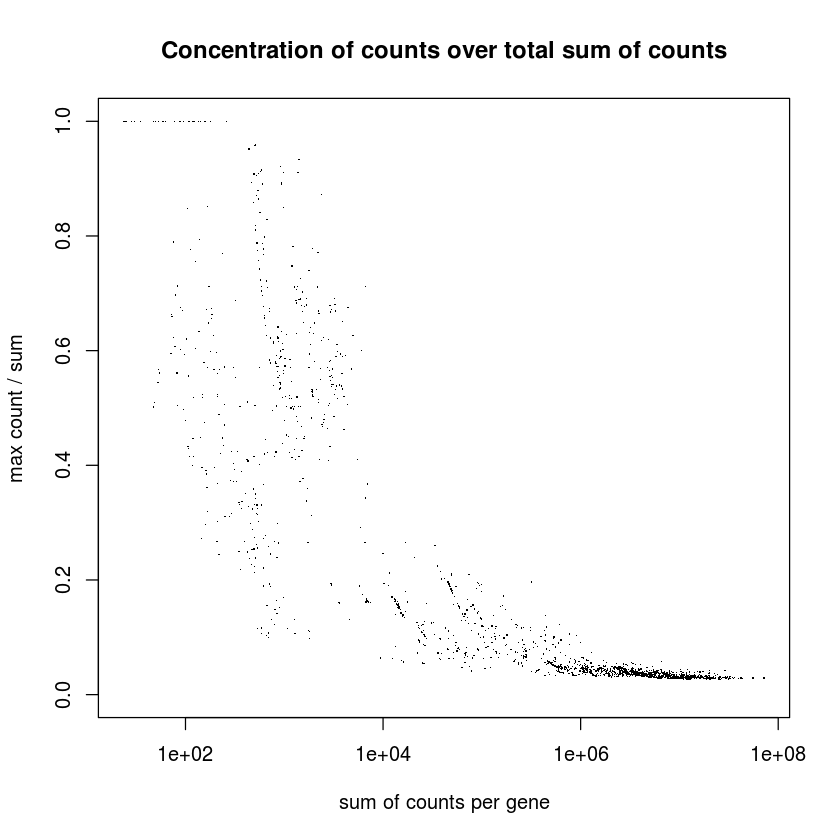

In [13]:
plotSparsity(dds.sf, pch='.')

In [14]:
dds.ed = estimateDispersions(dds.sf, fitType="local")

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


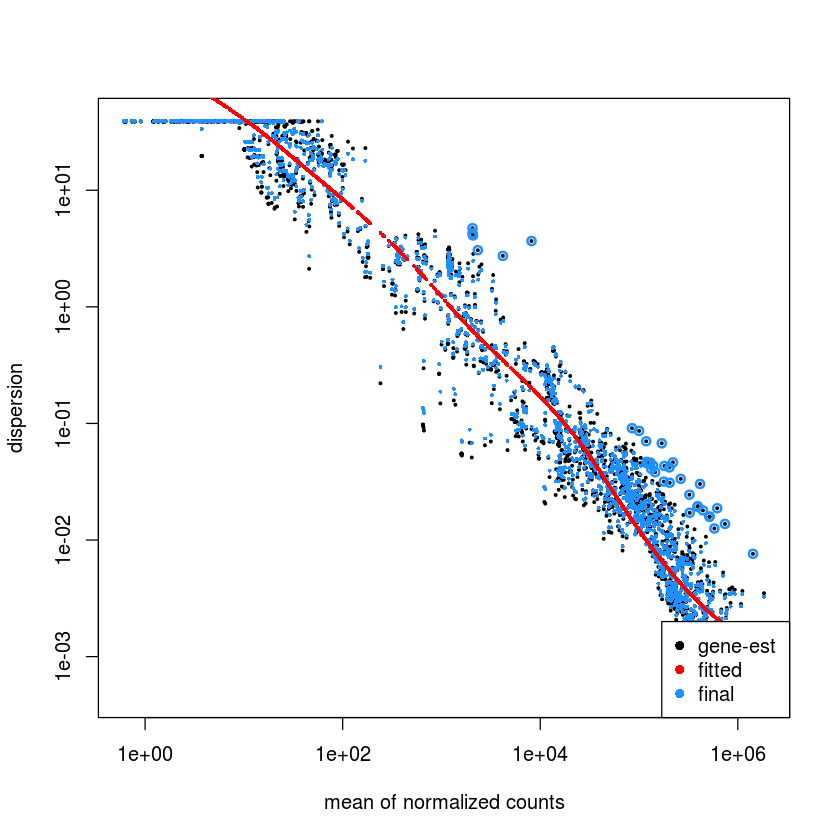

In [15]:
DESeq2::plotDispEsts(dds.ed)

In [16]:
dds2 = nbinomWaldTest(dds.ed)

#### Note : Don't use the fitype = mean

In [17]:
# Instead of going tru each step run DESeq wrapper
#ko.dds = DESeqDataSetFromMatrix( countData = ko.cecal2, colData = colData, design =~Tissue_Gps)
#ko.dds.wald.l = DESeq(ko.dds, test = "Wald", parallel = T, fitType = "local")
#DESeq2::plotDispEsts(ko.dds.wald.l)

- Check the Dispersion of the data again

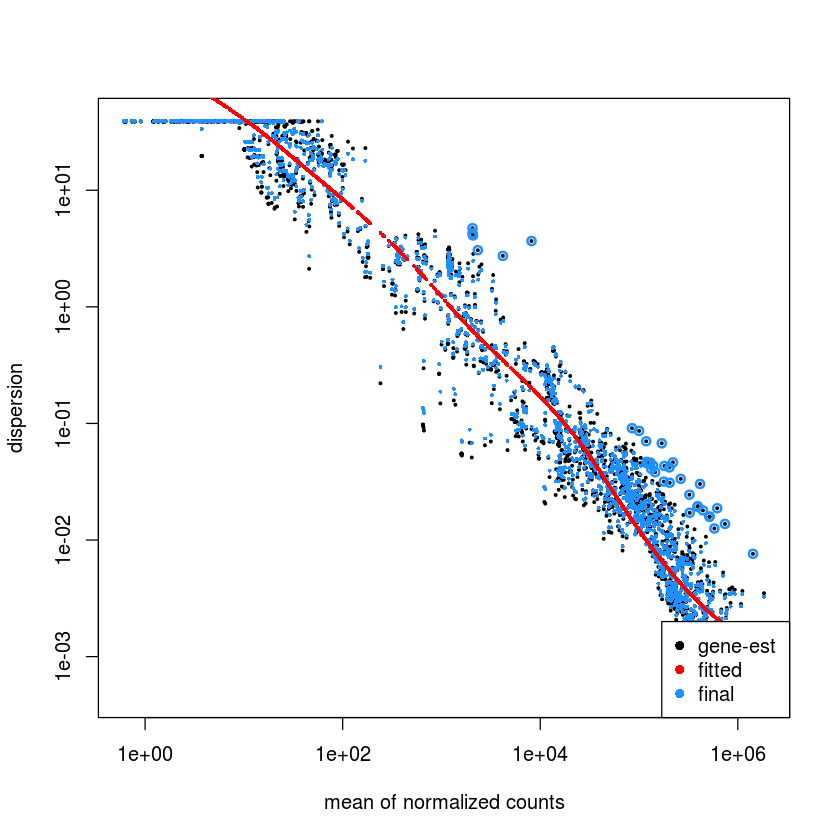

In [18]:
#png("images_cecal/cecal_dispersion.png")
DESeq2::plotDispEsts(dds2)
#dev.off()

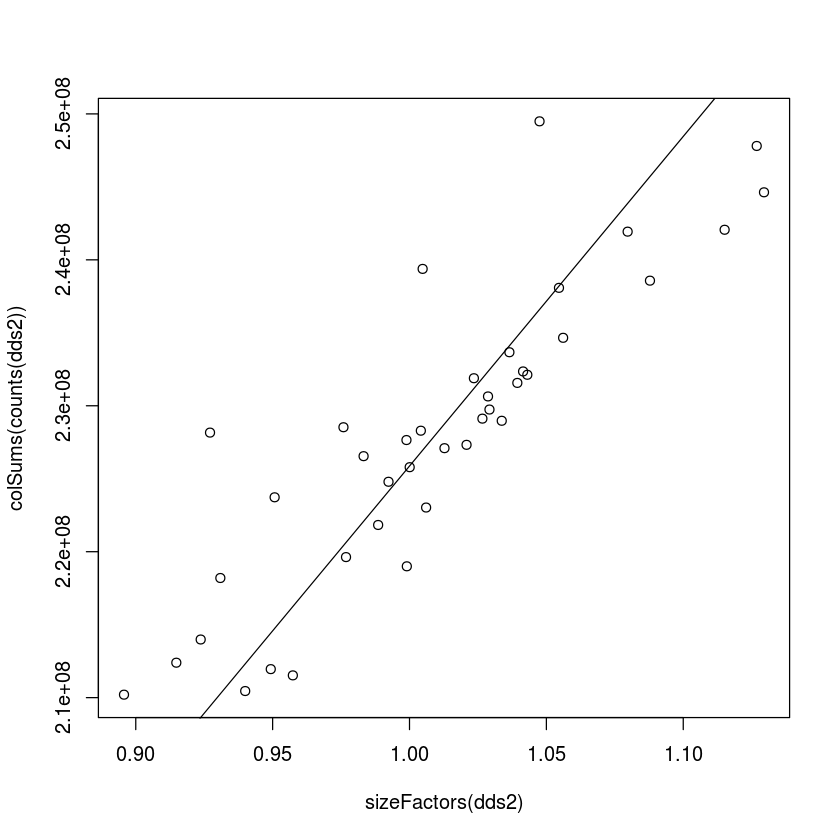

In [19]:
plot(sizeFactors(dds2), colSums(counts(dds2)))
abline(lm(colSums(counts(dds2)) ~ sizeFactors(dds2) + 0))

In [20]:
pl= as.data.frame(cbind(sf=sizeFactors(dds2),cs= colSums(counts(dds2))))
pl$SampleID = colData$SampleID
pl$Tissue = colData$Tissue

In [21]:
summary(pl)

       sf               cs               SampleID     Tissue         
 Min.   :0.8957   Min.   :210205091   CUR.C1 : 1   Length:39         
 1st Qu.:0.9763   1st Qu.:222431204   CUR.C2 : 1   Class :character  
 Median :1.0061   Median :228294180   CUR.C3 : 1   Mode  :character  
 Mean   :1.0090   Mean   :228124476   CUR.C4 : 1                     
 3rd Qu.:1.0404   3rd Qu.:233011654   CUR.C5 : 1                     
 Max.   :1.1295   Max.   :249492671   CUR.C6 : 1                     
                                      (Other):33                     

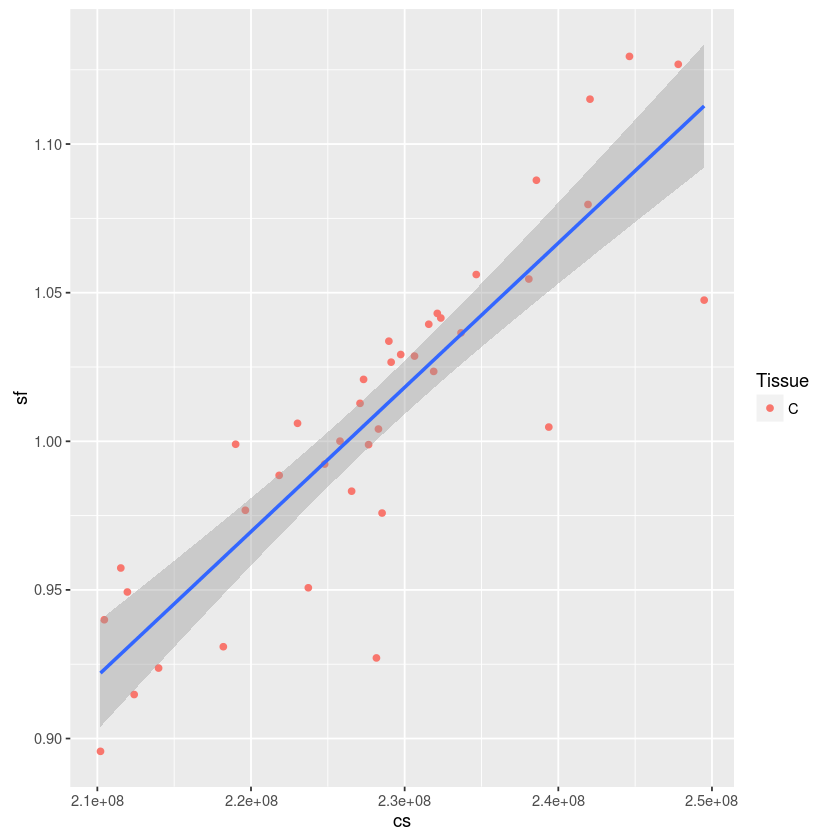

In [22]:
# Plot of ColSums of count vs SizeFactors  and apply linear model
ggplot(pl, aes(cs, sf) ) + geom_point(aes(color=Tissue)) + geom_smooth(method = "glm")
# there is a linear relationship between the colSums of each Sample and sizeFactor

In [24]:
summary(lm(pl$cs ~ pl$sf) )


Call:
lm(formula = pl$cs ~ pl$sf)

Residuals:
     Min       1Q   Median       3Q      Max 
-8502252 -2510859  -857078  1368102 15339023 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  69980158   14589104   4.797 2.64e-05 ***
pl$sf       156727964   14436168  10.857 4.66e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5055000 on 37 degrees of freedom
Multiple R-squared:  0.7611,	Adjusted R-squared:  0.7546 
F-statistic: 117.9 on 1 and 37 DF,  p-value: 4.659e-13


### Normalize the Cecal count Data using vst method

- make the vst count data
- plot heatmap for each contrast

In [25]:
vst.dds2 = varianceStabilizingTransformation(dds2, blind = FALSE)

# Get the vst transformed count data
vst.dds2.counts = assay(vst.dds2)
vst.dds2.counts %>% dim
cnames = as.character(colData(dds2)$SampleID)
colnames( vst.dds2.counts ) = cnames
vst.dds2.counts[1:5,1:5]

[1] 2522   39

,RSVCUR.C2,RSVCUR.C7,RSVCUR.C1,RSVCUR.C6,RSVCUR.C3
K01361,16.23195,16.23195,16.23195,16.28521,16.23195
K01362,18.08287,18.09428,18.09261,18.08422,18.21038
K05844,16.23195,16.23195,16.23195,16.23195,16.23195
K05845,16.45298,16.49449,16.37391,16.42867,16.34879
K05846,17.70735,17.70493,17.74131,17.78357,17.66365


In [26]:
rl.dds2 = rlogTransformation(dds2, blind = FALSE)

# Get the vst transformed count data
rl.dds2.counts = assay(rl.dds2)
rl.dds2.counts %>% dim
cnames = as.character(colData(dds2)$SampleID)
colnames( rl.dds2.counts ) = cnames
rl.dds2.counts[1:5,1:5]

[1] 2522   39

,RSVCUR.C2,RSVCUR.C7,RSVCUR.C1,RSVCUR.C6,RSVCUR.C3
K01361,1.804921,1.804921,1.804921,1.810775,1.804921
K01362,17.95898,17.97282,17.97079,17.96062,18.10973
K05844,4.001991,4.001991,4.001991,4.001991,4.001991
K05845,10.79057,10.81960,10.75156,10.77635,10.74348
K05846,17.30303,17.29977,17.34818,17.40317,17.24355


Mean SD plot of the log2 counts


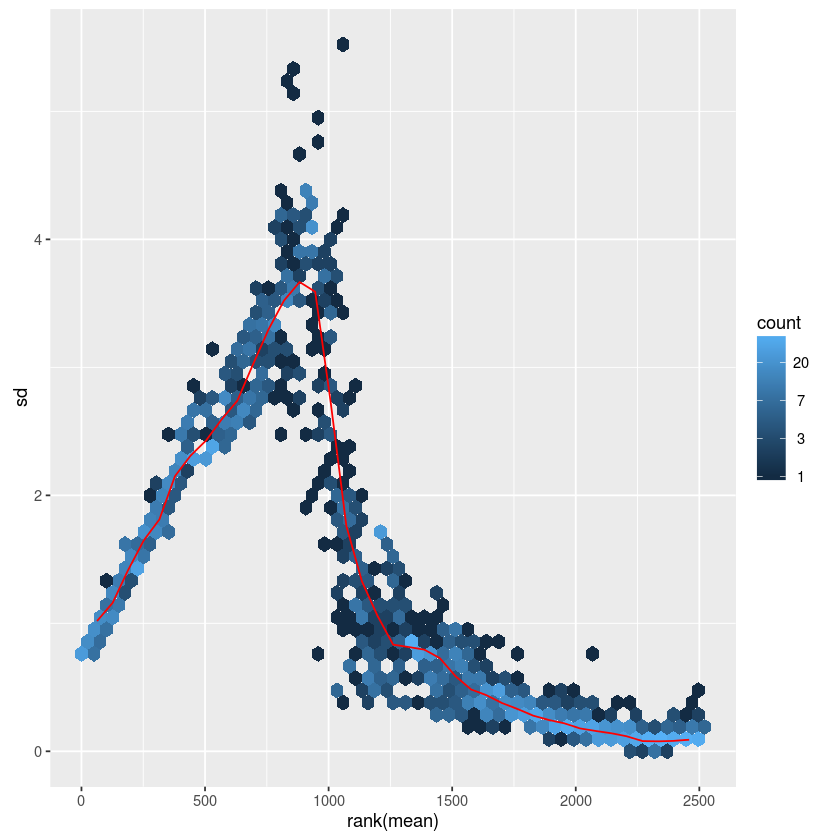

In [27]:
cat("Mean SD plot of the log2 counts\n")
meanSdPlot(log2(assay(dds2) + 1))

Mean SD plot of the vst normalized counts


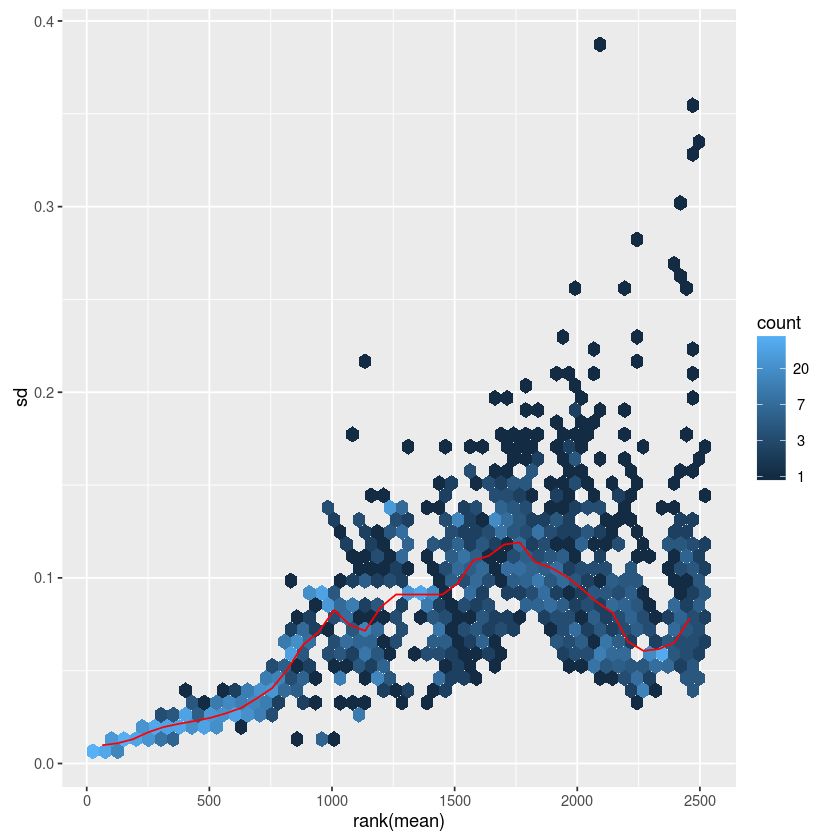

In [28]:
cat("Mean SD plot of the vst normalized counts\n")
meanSdPlot( vst.dds2.counts )

Mean SD plot of the rlog normalized counts


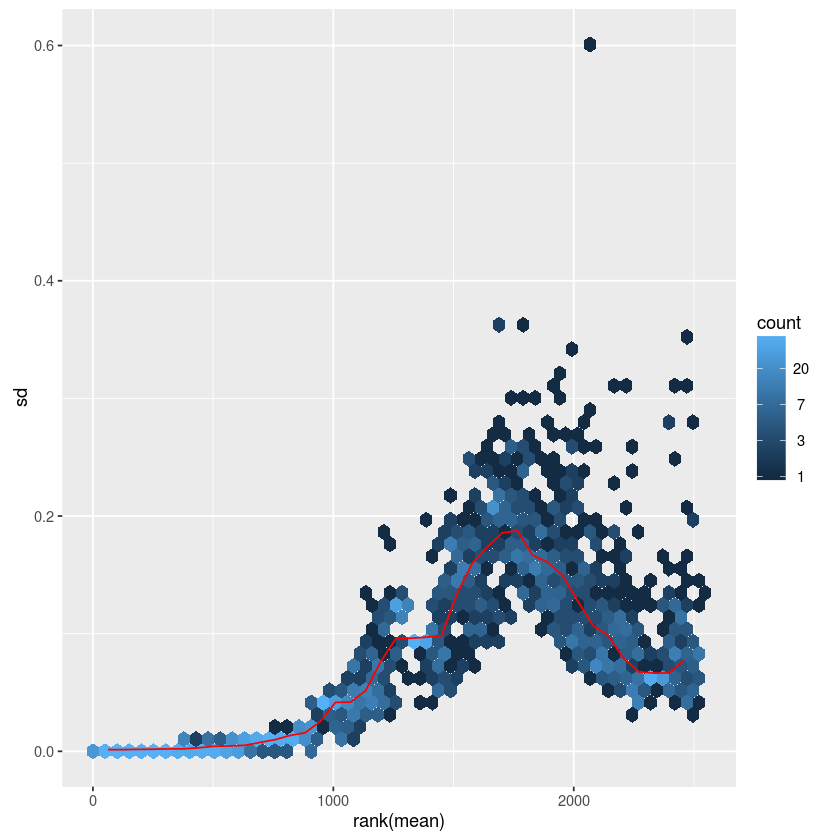

In [29]:
cat("Mean SD plot of the rlog normalized counts\n")
#png("images_cecal/rlog_norm_meansdplot.png")
meanSdPlot( rl.dds2.counts )
#dev.off()

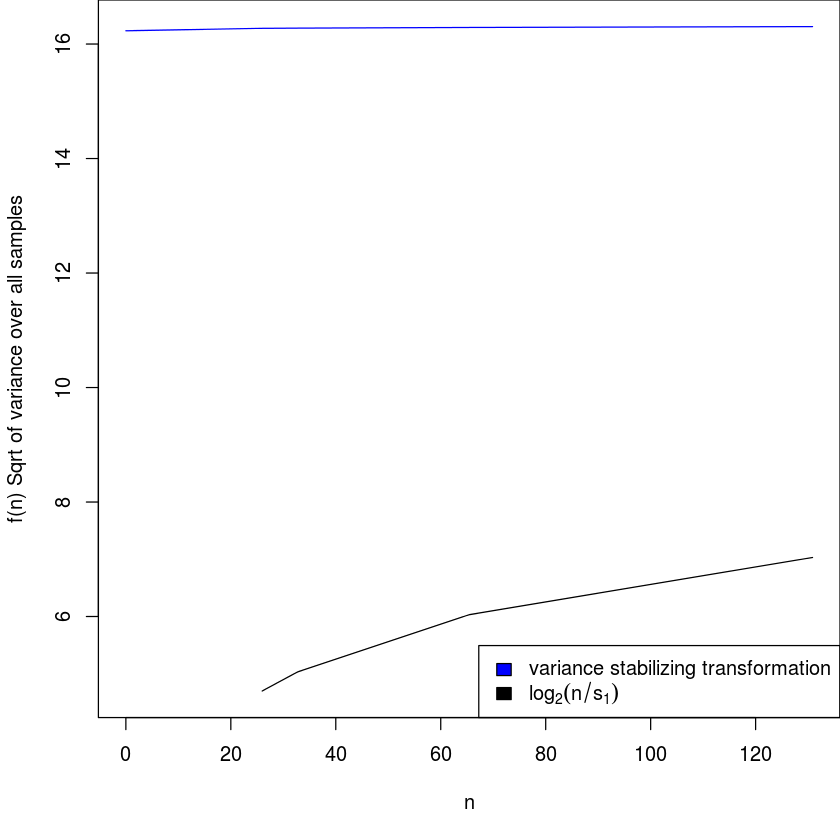

In [30]:
#png("images_cecal/DESeq2_VST_and_log2.png")
par(mai=ifelse(1:4 <= 2, par("mai"), 0))
px     = counts(dds2)[,1] / sizeFactors(dds2)[1]
ord    = order(px)
ord    = ord[px[ord] < 150]
ord    = ord[seq(1, length(ord), length=50)]
last   = ord[length(ord)]
vstcol = c("blue", "black")
matplot(px[ord], cbind(assay(vst.dds2)[, 1], log2(px))[ord, ], type="l", lty=1, col=vstcol, xlab="n", ylab="f(n) Sqrt of variance over all samples")
legend("bottomright", legend = c(expression("variance stabilizing transformation"), expression(log[2](n/s[1]))), fill=vstcol)
#dev.off()
#dev.copy(png,"images_cecal/DESeq2_VST_and_log2.png")

What the heck. why is rlog tranformation gives a box plot which is good where as 

In [31]:
# par(mai=ifelse(1:4 <= 2, par("mai"), 0))
# px     = counts(dds2)[,1] / sizeFactors(dds2)[1]
# ord    = order(px)
# ord    = ord[px[ord] < 150]
# ord    = ord[seq(1, length(ord), length=50)]
# last   = ord[length(ord)]
# vstcol = c("blue", "black")
# matplot(px[ord], cbind(assay(rl.dds2)[, 1], log2(px))[ord, ], type="l", lty=1, col=vstcol, xlab="n", ylab="f(n) Sqrt of variance over all samples")
# legend("bottomright", legend = c(expression("rlog transformation"), expression(log[2](n/s[1]))), fill=vstcol)
# dev.copy(png,"DESeq2_VST_and_log2.png")

Box Plot of row count data


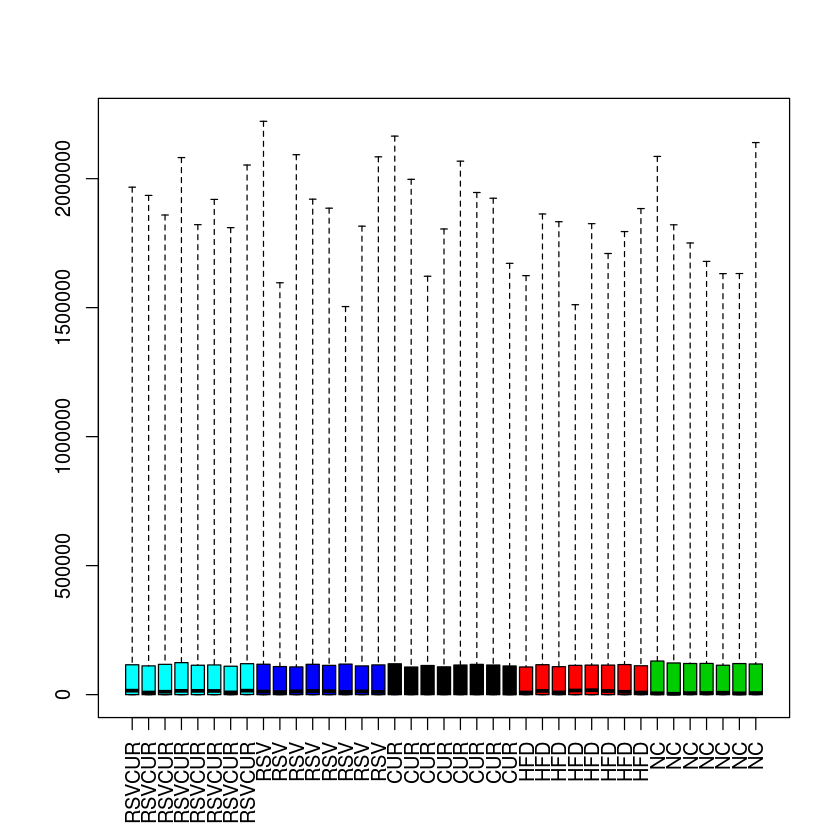

In [32]:
cat( "Box Plot of row count data\n" )
boxplot(assay(dds2),
        range=0,
        las=3, 
        horizontal=F, 
        names = colData$Treatment, 
        col=colData$Treatment, 
        pch='.')

Box Plot of log2 transformed row count data


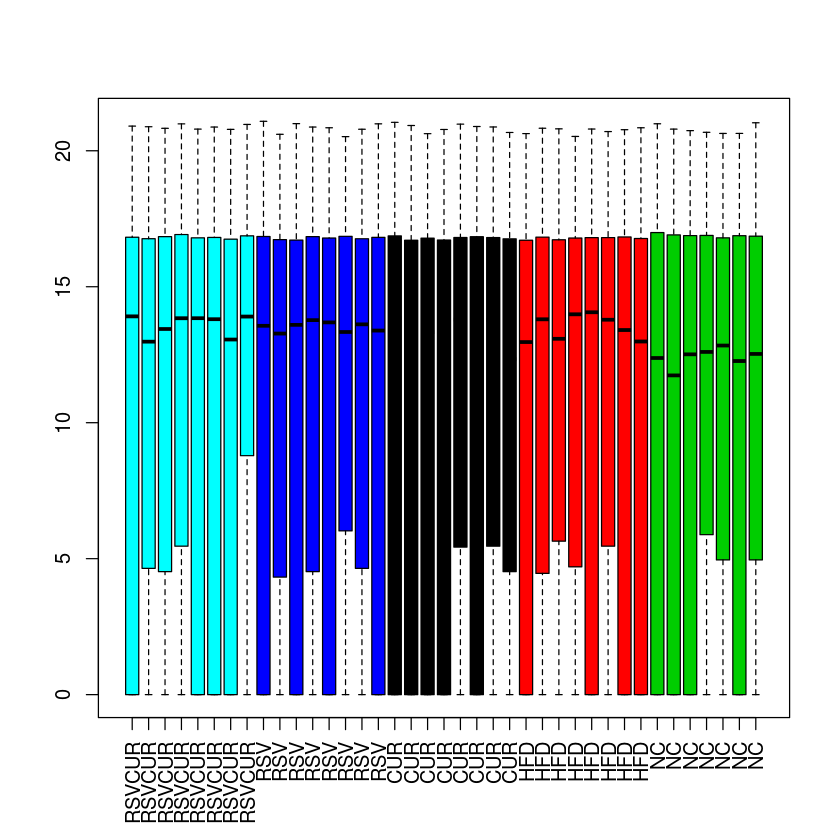

In [33]:
cat( "Box Plot of log2 transformed row count data\n" )
boxplot(log2(assay(dds2) +1),
        range=0,
        las=3, 
        horizontal=F, 
        names = colData$Treatment, 
        col=colData$Treatment, 
        pch='.')

Box Plot of the vst trasnformed count data


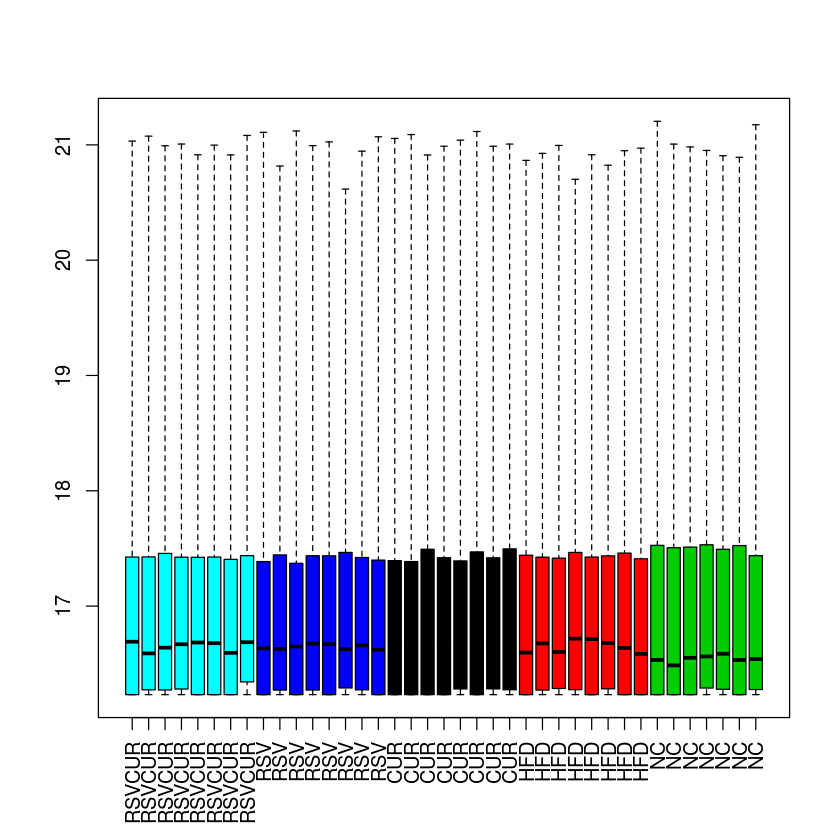

In [34]:
cat( "Box Plot of the vst trasnformed count data\n" )
boxplot(vst.dds2.counts,
        range=0,
        las=3, 
        horizontal=F, 
        names = colData$Treatment, 
        col=colData$Treatment, 
        pch='.')

Box Plot of the rlog trasnformed count data


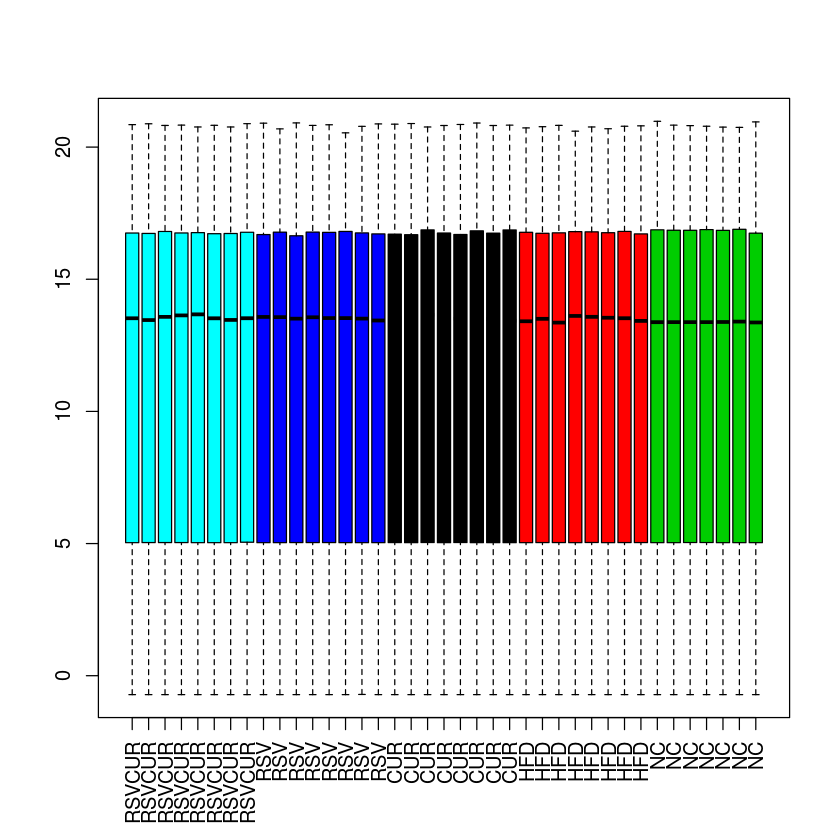

In [35]:
cat( "Box Plot of the rlog trasnformed count data\n" )
boxplot(rl.dds2.counts,
        range=0,
        las=3, 
        horizontal=F, 
        names = colData$Treatment, 
        col=colData$Treatment, 
        pch='.')

Get the Differential Expression across different contrasts
--

- Get the contrasts from file
- Loop over each pair of contrast and run results on the filtered::normalized deseq2 object [ vst.dds2 ]
- filter the results
- save the plots
- get the pathways for up and downregulated genes
---
###### important parameters for results
  - alpaha set to 0.05
  - contrast category Tissue_Gps
###### objects
  - dds2
  - vst.dds2
###### contrasts
 - 

### Contrast : 

In [36]:
cts = read.table(file = "combinations.txt")
colnames(cts)= c('left','right')
cecel.cts = cts[1:5,]
cecel.cts

,left,right
1,Cecal_NC,Cecal_HFD
2,Cecal_HFD,Cecal_RSV
3,Cecal_HFD,Cecal_CUR
4,Cecal_RSV,Cecal_RSVCUR
5,Cecal_CUR,Cecal_RSVCUR


Looping tru all 5 cecal contrasts 
- get the up , down differentially expressed keggs
- save the ma plot and volcano plot

Cecal_NC.vs.Cecal_HFD 	 2522 	 688 	 234 	 454 
Cecal_HFD.vs.Cecal_RSV 	 2522 	 81 	 80 	 1 


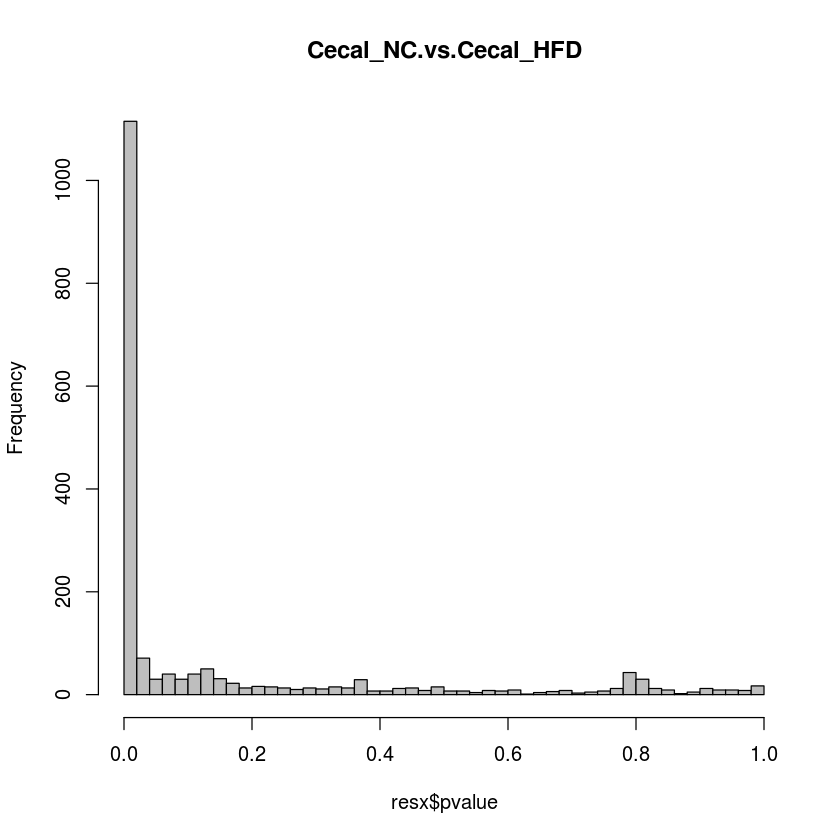

Cecal_HFD.vs.Cecal_CUR 	 2522 	 189 	 163 	 26 


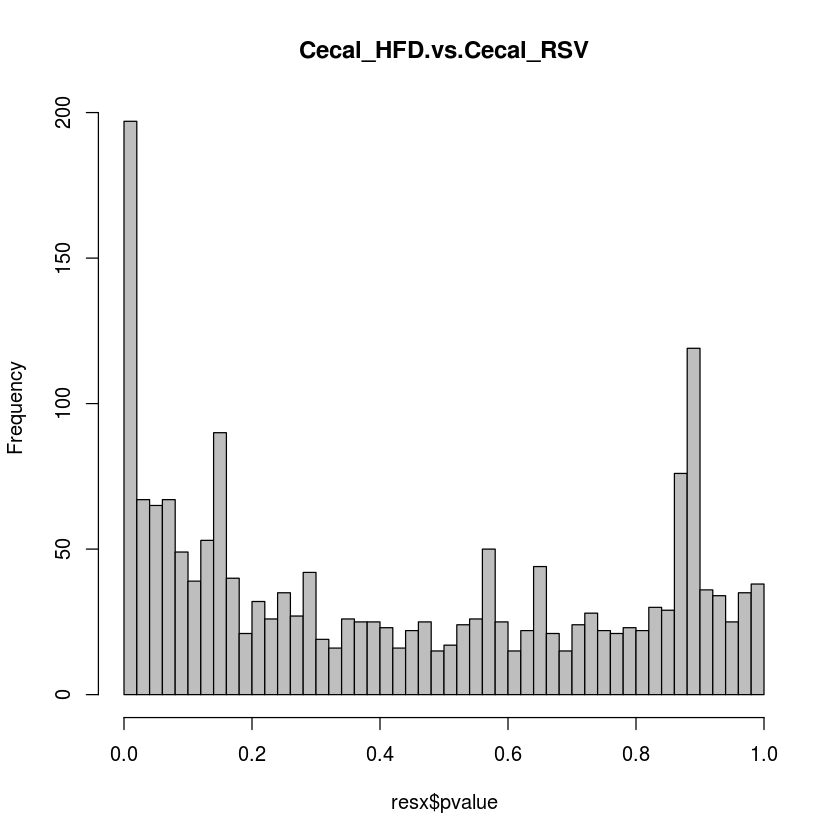

Cecal_RSV.vs.Cecal_RSVCUR 	 2522 	 66 	 21 	 45 


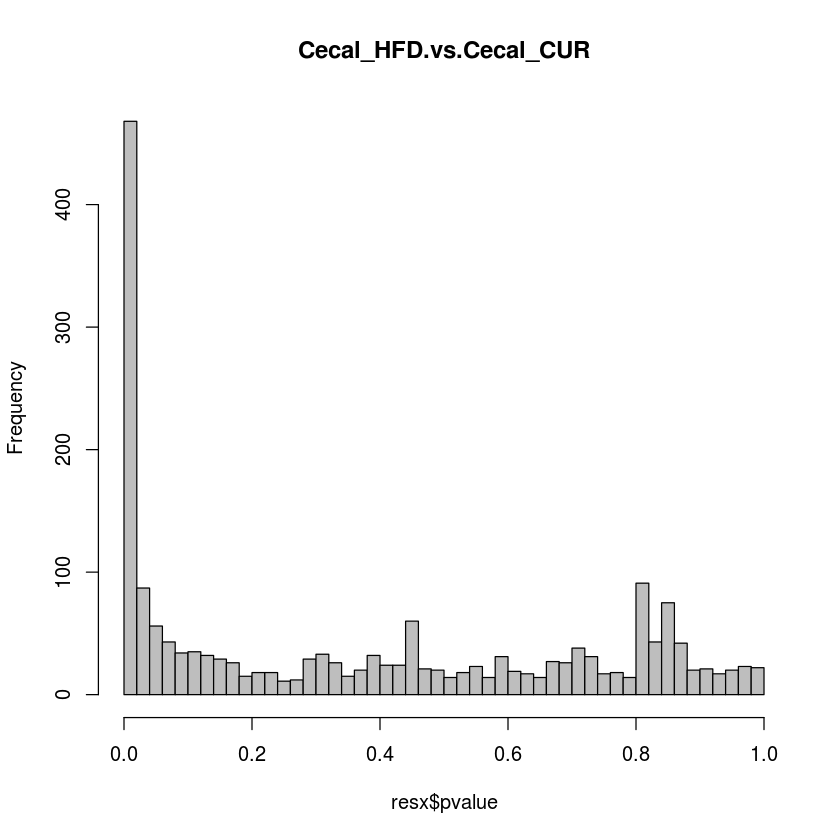

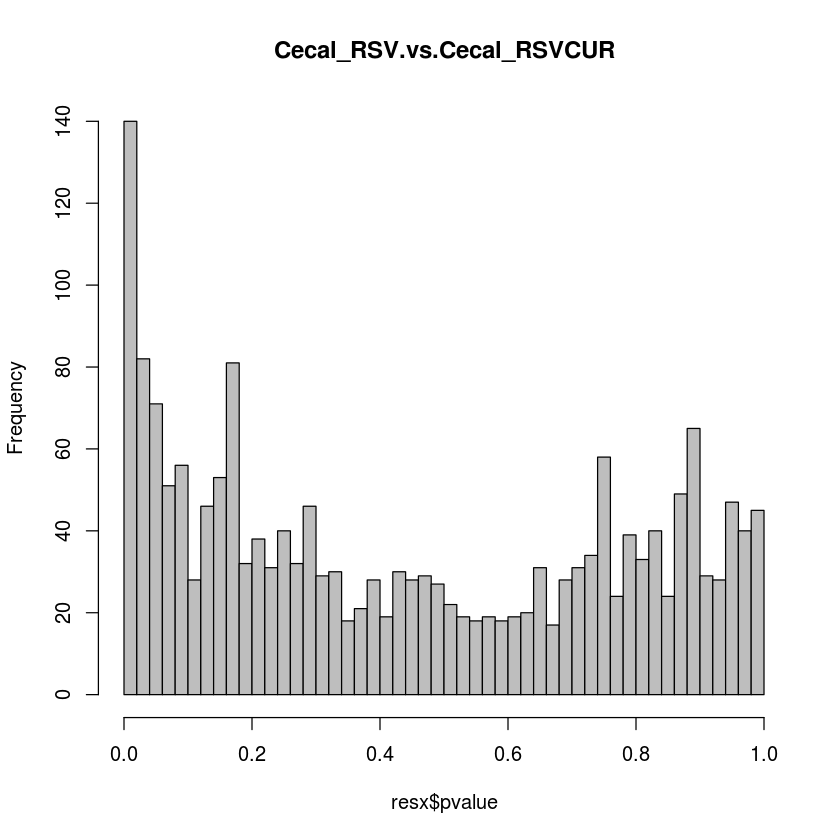

Cecal_CUR.vs.Cecal_RSVCUR 	 2522 	 24 	 16 	 8 


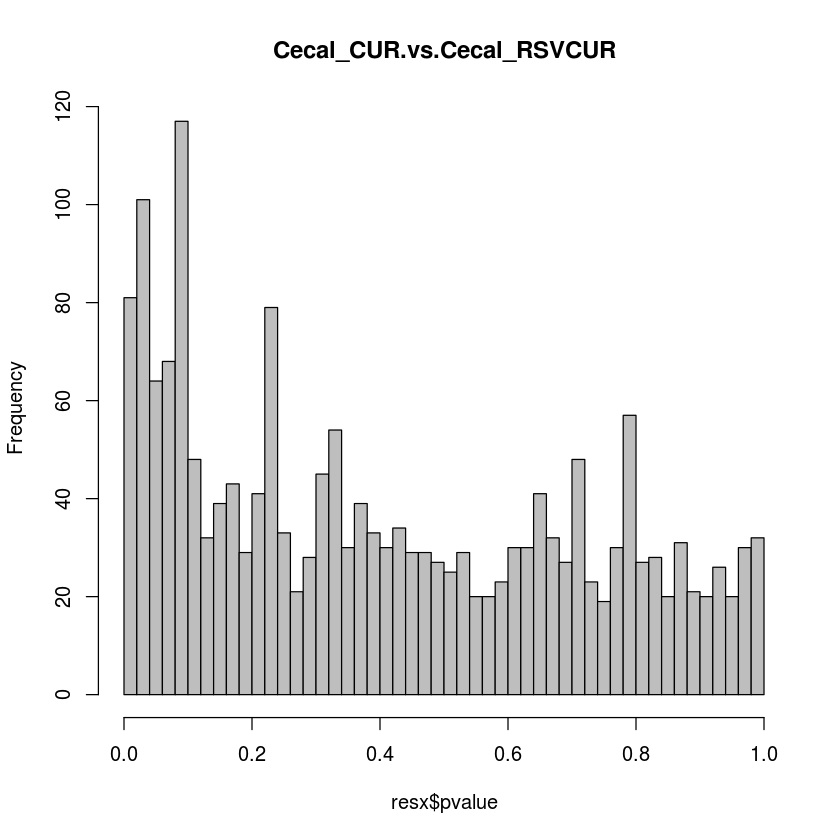

In [37]:
# Main Loop

for ( i in 1:(nrow(cecel.cts))){
    # lc : left contrast , rc : right contrast
    lc= as.character(cecel.cts$left[i])
    rc= as.character(cecel.cts$right[i])
    
    main=paste0(lc,'.vs.',rc)
    #cat( "Processing ", main,"\n")
    
# Outfile Variables
    of_full_tsv = paste0('cecaldeseq/data/complete_',lc,'.vs.',rc,'.tsv')
    of_filtered_tsv = paste0('cecaldeseq/data/filtered_',lc,'.vs.',rc,'.tsv')
    of_up_tsv = paste0('cecaldeseq/data/up_',lc,'.vs.',rc,'.tsv')
    of_down_tsv = paste0('cecaldeseq/data/down_',lc,'.vs.',rc,'.tsv')
    of_ma_png = paste0('cecaldeseq/images/maPlot_',lc,'.vs.',rc,'.png')
    of_vol_png = paste0('cecaldeseq/images/volcanoPlot_',lc,'.vs.',rc,'.png')
    
    # Make the result for the contrast lc and rc
    # keeping the alpha to 0.05 so that the adjusted p-value cut off will be equal to 0.05 alpha = 0.05
    # not setting alpha 
    #<<<<<<<<<<<<<<<<>>>>>>>>>>>>>>>>
    lfcthresh=0.4
    sigthresh=0.05
    #<<<<<<<<<<<<<<<<>>>>>>>>>>>>>>>>
    resx = results( dds2, contrast = c('Tissue_Gps', lc, rc))
    #resx = results( dds2, contrast = c('Tissue_Gps', lc, rc), lfcThreshold = lfcthresh, alpha = sigthresh)
    #summary(resx)

# find the top gene with lowest pvalue
    topGene = rownames(resx)[which.min(resx$padj)]
    
# Make the MA plot
    png(of_ma_png, 1500, 1000, pointsize=20)
    plotMA(resx, main=main,alpha = sigthresh)
    dev.off()
        
    # Plot the histogram of pvalues
      hist( resx$pvalue, breaks=40, col="grey" , main=main)
    
# Make the Volcano plot
    table(resx$pvalue < sigthresh)
    ## Order by adjusted p-value
    resx = resx[order(resx$pvalue), ]
    ## Merge with normalized count data
    resdata = merge(as.data.frame(resx), 
                    as.data.frame(assay(vst.dds2)), 
                    by="row.names", sort=FALSE)
    names(resdata)[1] = "kegg.id"
    #dim(resdata)
    png(of_vol_png, 1500, 1000, pointsize=20)
    r.volcanoplot(resdata, main=main, xlim=(c(-5,5)))
    dev.off()
    
# Subset the data by filtering out the crap and split it to up and down    
    resx1 = as.data.frame(resx)
    resx1$keggid = rownames( resx)
    resx1 = resx1 %>% dplyr::select(keggid, baseMean,log2FoldChange, lfcSE,stat, pvalue, padj)
    
    # instead of filtering by pvalue should use padj
    resSig = as.data.frame(resx1) %>%
       dplyr::filter(pvalue < sigthresh) %>%
       dplyr::filter(abs(log2FoldChange) > lfcthresh)
# Write the Entire Data 
     write.table(as.data.frame(resx1), of_full_tsv, sep="\t", row.names=FALSE, quote = FALSE)
     write.table(resSig , of_filtered_tsv, sep="\t", row.names=FALSE, quote = FALSE)
      
# upRegulated
    upreg = resSig %>%
        dplyr::arrange(padj) %>%
        dplyr::filter( log2FoldChange > 0)
    write.table(upreg ,of_up_tsv, sep="\t", row.names=FALSE, quote = FALSE)
    
# downUpregulated 
    downreg = resSig %>%
        dplyr::arrange(padj) %>%
        dplyr::filter( log2FoldChange < 0)
    write.table(downreg ,of_down_tsv, sep="\t", row.names=FALSE, quote = FALSE)
    cat( main,"\t", nrow(resx),"\t",nrow(resSig),"\t", nrow(upreg) ,"\t", nrow(downreg),"\n" )
    
}

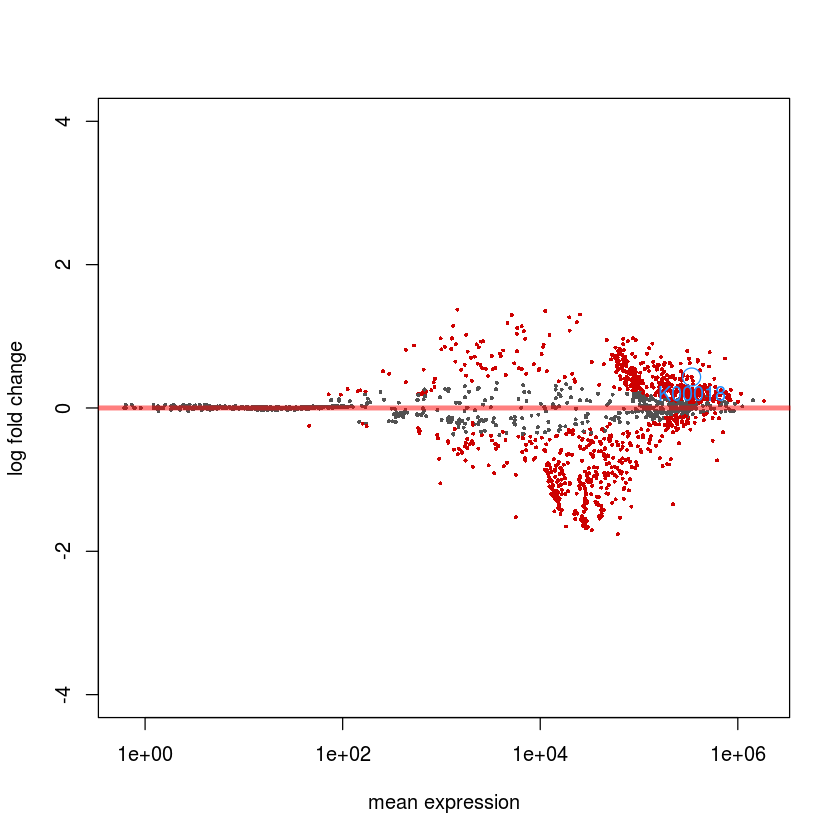

In [39]:
lc = 'Cecal_NC'
rc = 'Cecal_HFD'
resx= results( dds2, contrast = c('Tissue_Gps',lc , rc))
# DESeq2::plotMA( resx )
# find the top gene with lowest pvalue
topGene = rownames(resx)[which.min(resx$padj)]
r.plotMA(resx, topGene = topGene)

## Heatmaps of first 50 highly expressed keggs for each pair of contrast
    - data is vst.dds2.count
    - create ann.col for each contrast ex :  NC vs HFD, RSV vs RSVCUR
    - then subset the count data for the contrast ex : columns containing NC and HFDs

### Preparing annotation column for each pair of contrast

In [40]:
vst.dds2.counts[1:5,1:5]
vst.dds2.counts %>% dim
colnames( vst.dds2.counts) 
r.get_col( as.character(colnames( vst.dds2.counts) ), "[.]",1 ) %>% table
# make a annotation_col df with SampleIDs as rownames and Treatment_Tissue , Treatment as colnames

,RSVCUR.C2,RSVCUR.C7,RSVCUR.C1,RSVCUR.C6,RSVCUR.C3
K01361,16.23195,16.23195,16.23195,16.28521,16.23195
K01362,18.08287,18.09428,18.09261,18.08422,18.21038
K05844,16.23195,16.23195,16.23195,16.23195,16.23195
K05845,16.45298,16.49449,16.37391,16.42867,16.34879
K05846,17.70735,17.70493,17.74131,17.78357,17.66365


[1] 2522   39

[1] "RSVCUR.C2" "RSVCUR.C7" "RSVCUR.C1" "RSVCUR.C6" "RSVCUR.C3" "RSVCUR.C4"
 [7] "RSVCUR.C5" "RSVCUR.C8" "RSV.C1"    "RSV.C4"    "RSV.C2"    "RSV.C3"   
[13] "RSV.C5"    "RSV.C6"    "RSV.C8"    "RSV.C7"    "CUR.C2"    "CUR.C4"   
[19] "CUR.C5"    "CUR.C1"    "CUR.C6"    "CUR.C8"    "CUR.C7"    "CUR.C3"   
[25] "HFD.C1"    "HFD.C5"    "HFD.C2"    "HFD.C3"    "HFD.C4"    "HFD.C7"   
[31] "HFD.C8"    "HFD.C6"    "NC.C2"     "NC.C1"     "NC.C3"     "NC.C5"    
[37] "NC.C7"     "NC.C4"     "NC.C6"

.
   CUR    HFD     NC    RSV RSVCUR 
     8      8      7      8      8 

In [41]:
# Made a data frame called vst.df , which contains all column information
# Subset from this df to get specific contrast and put it into ann.col
vst.counts.cnames = as.character( colnames( vst.dds2.counts) ) 
vst.df = data.frame(Treatment = r.get_col( vst.counts.cnames, "[.]",1) )
vst.df$SampleID = vst.counts.cnames
#head( vst.df )

vst.df2 = vst.df
rownames(vst.df2) = vst.df$SampleID
vst.df2$SampleID = NULL

### Subsetting the vst.dds2.counts for the contrast  Cecal_NC vs Cacal_HFD

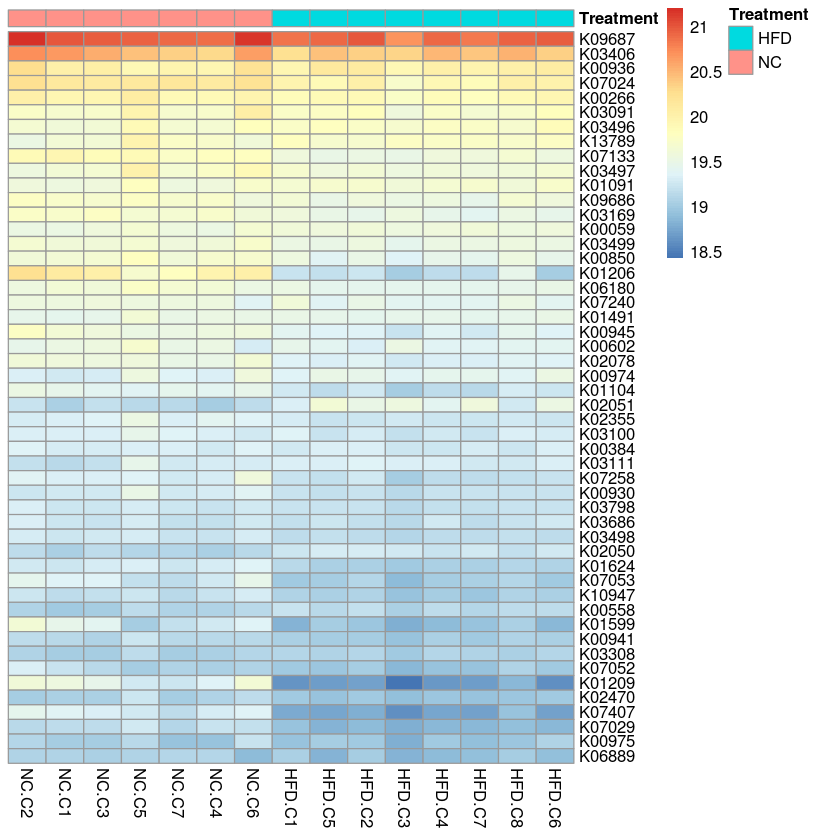

In [42]:
all.df = as.data.frame(vst.dds2.counts) %>% dplyr::select(starts_with('NC'), starts_with('HFD'))
select = order( rowMeans( all.df ), decreasing=TRUE)[1:50]
filtered.df = all.df[select,]

# ann.col = vst.df[grepl( 'NC|HFD', vst.df$Treatment) ,]
# rownames(ann.col) = ann.col$SampleID
# ann.col$SampleID = NULL
# #ann.col %>% table

#pheatmap( all.df, annotation_col = vst.df2)
#png("cecaldeseq/images/heatmap_nc_vs_hfd.png")
pheatmap( filtered.df, annotation_col = vst.df2, cluster_rows = F,cluster_cols = F)
#dev.off()

### Subsetting the vst.dds2.counts for the contrast  Cecal_HFD vs Cacal_RSV

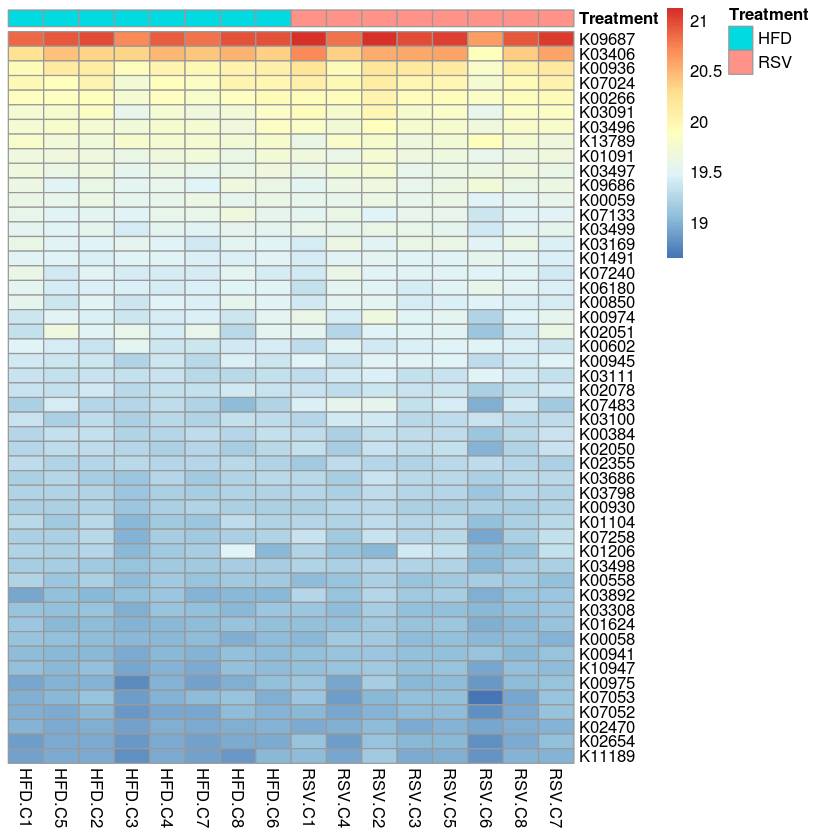

In [43]:
all.df = as.data.frame(vst.dds2.counts) %>% dplyr::select(starts_with('HFD'), starts_with('RSV.'))
select = order( rowMeans( all.df ), decreasing=TRUE)[1:50]
filtered.df = all.df[select,]

ann.col = vst.df[grepl( 'HFD|RSV', vst.df$Treatment) ,]
rownames(ann.col) = ann.col$SampleID
ann.col$SampleID = NULL
#ann.col %>% table
#png("cecaldeseq/images/heatmap_hfd_vs_rsv.png")
pheatmap( filtered.df, annotation_col = ann.col, cluster_rows = F, cluster_cols = F)
#dev.off()

### Subsetting the vst.dds2.counts for the contrast  Cecal_HFD vs Cacal_CUR

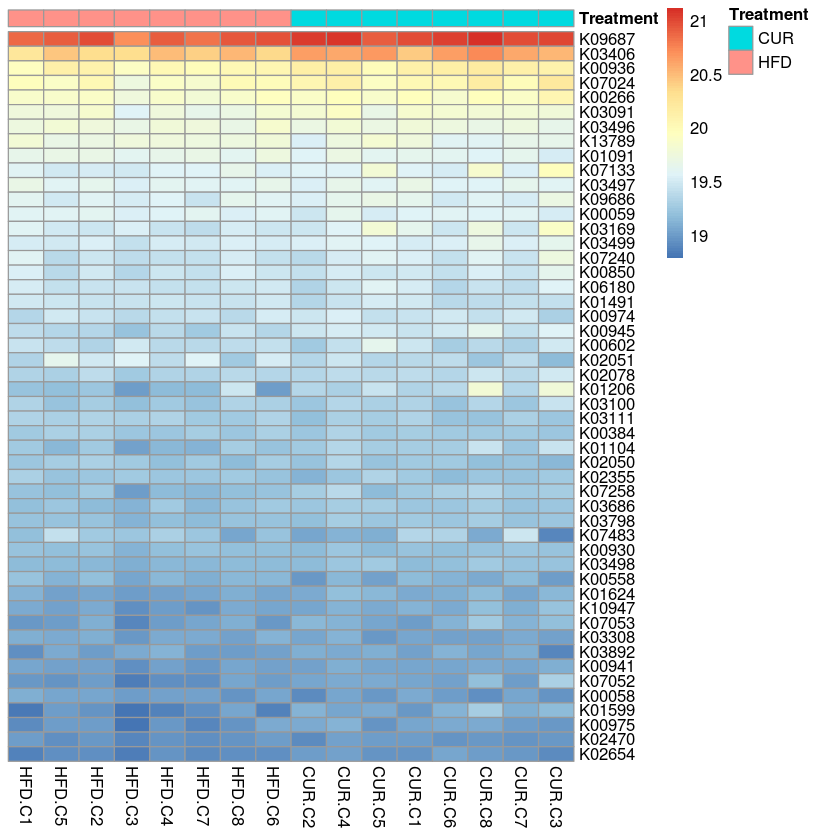

In [44]:
all.df = as.data.frame(vst.dds2.counts) %>% dplyr::select(starts_with('HFD'), starts_with('CUR'))
select = order( rowMeans( all.df ), decreasing=TRUE)[1:50]
filtered.df = all.df[select,]
#png("cecaldeseq/images/heatmap_hfd_vs_cur.png")
pheatmap( filtered.df, annotation_col = vst.df2, cluster_rows = F,cluster_cols = F)
#dev.off()

### Subsetting the vst.dds2.counts for the contrast  Cecal_RSV vs Cacal_RSVCUR

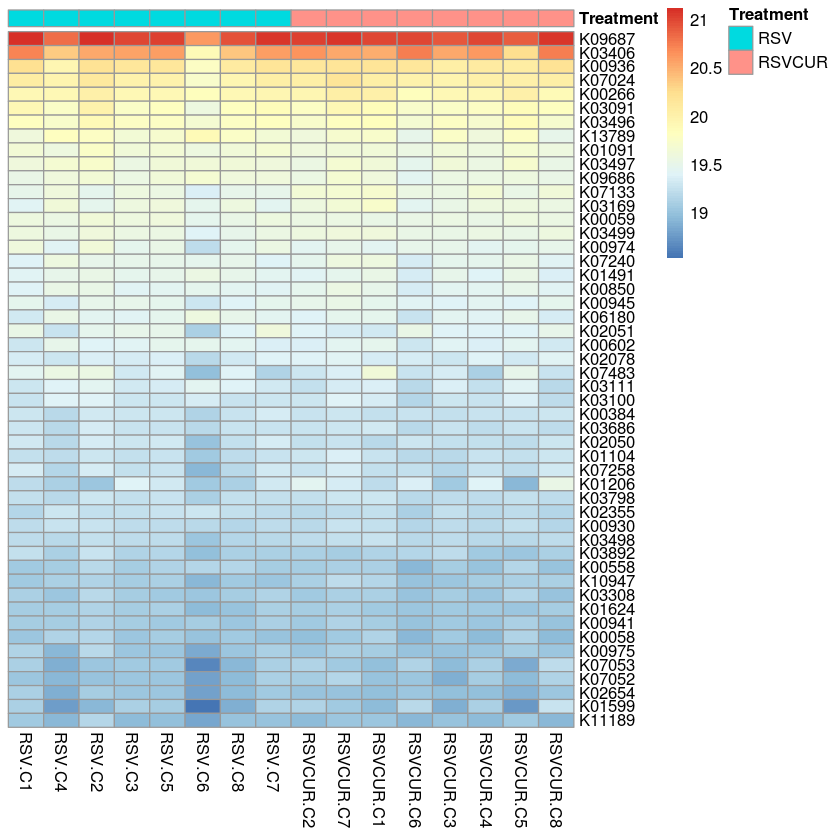

In [45]:
all.df = as.data.frame(vst.dds2.counts) %>% dplyr::select(starts_with('RSV.'), starts_with('RSVCUR.'))
select = order( rowMeans( all.df ), decreasing=TRUE)[1:50]
filtered.df = all.df[select,]
#png("cecaldeseq/images/heatmap_rsv_vs_rsvcur.png")
pheatmap( filtered.df, annotation_col = vst.df2, cluster_rows = F,cluster_cols = F)
#dev.off()

### Subsetting the vst.dds2.counts for the contrast  Cecal_CUR vs Cacal_RSVCUR

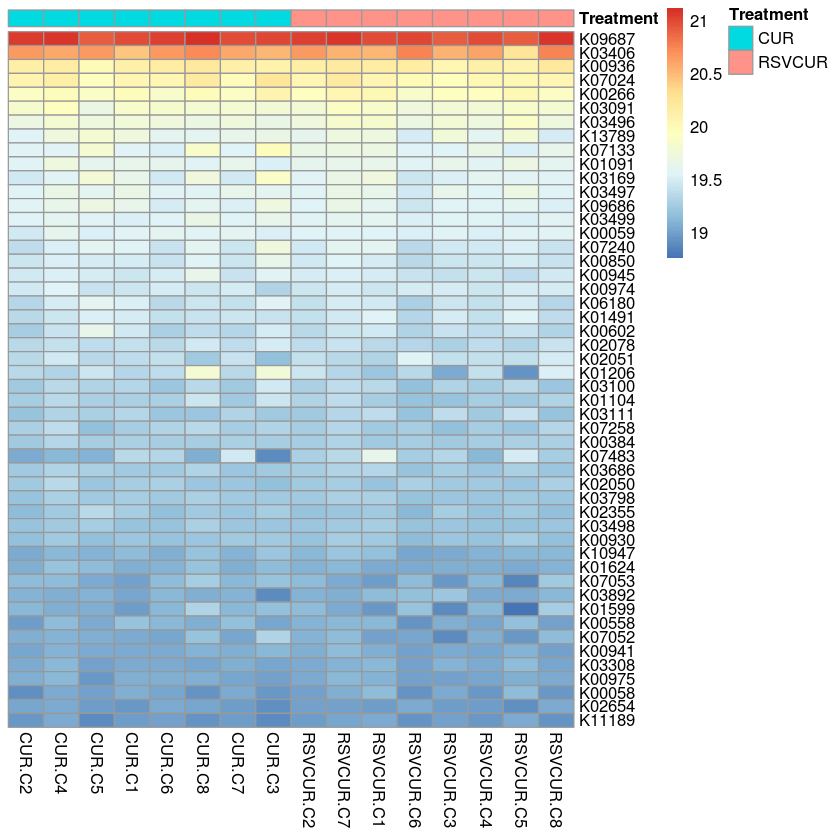

In [46]:
all.df = as.data.frame(vst.dds2.counts) %>% dplyr::select(starts_with('CUR.'), starts_with('RSVCUR.'))
select = order( rowMeans( all.df ), decreasing=TRUE)[1:50]
filtered.df = all.df[select,]
#png("cecaldeseq/images/heatmap_cur_vs_rsvcur.png")
pheatmap( filtered.df, annotation_col = vst.df2, cluster_rows = F,cluster_cols = F)
#dev.off()

PCA
--

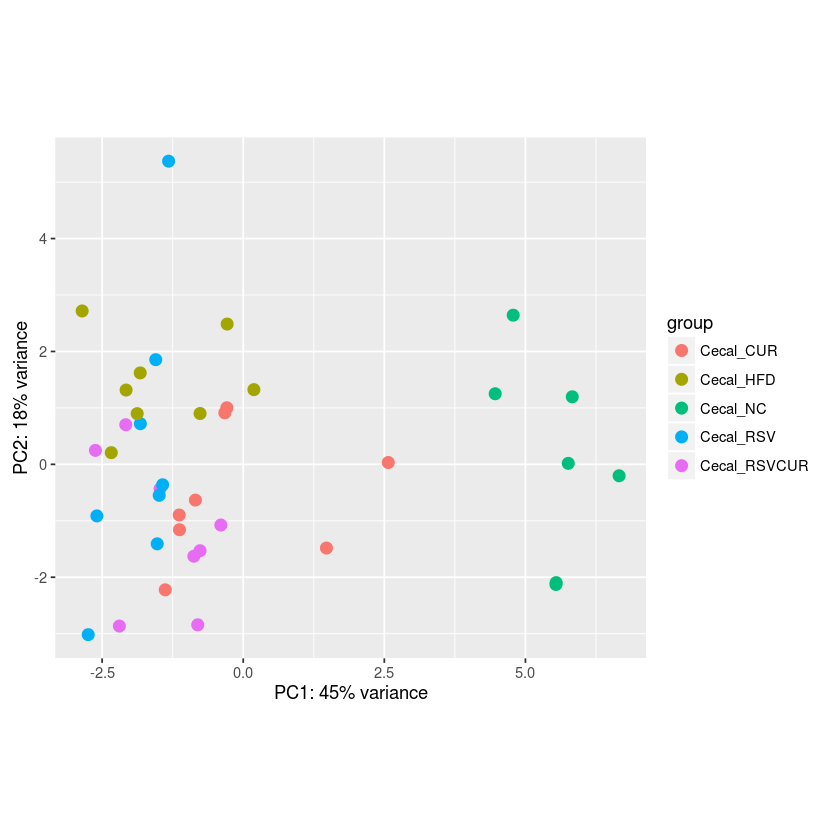

In [47]:
#png("cecaldeseq/images/pca.cecal.png", pointsize=20)
DESeq2::plotPCA(vst.dds2, intgroup=c('Tissue_Gps'), ntop=2522)
#dev.off()

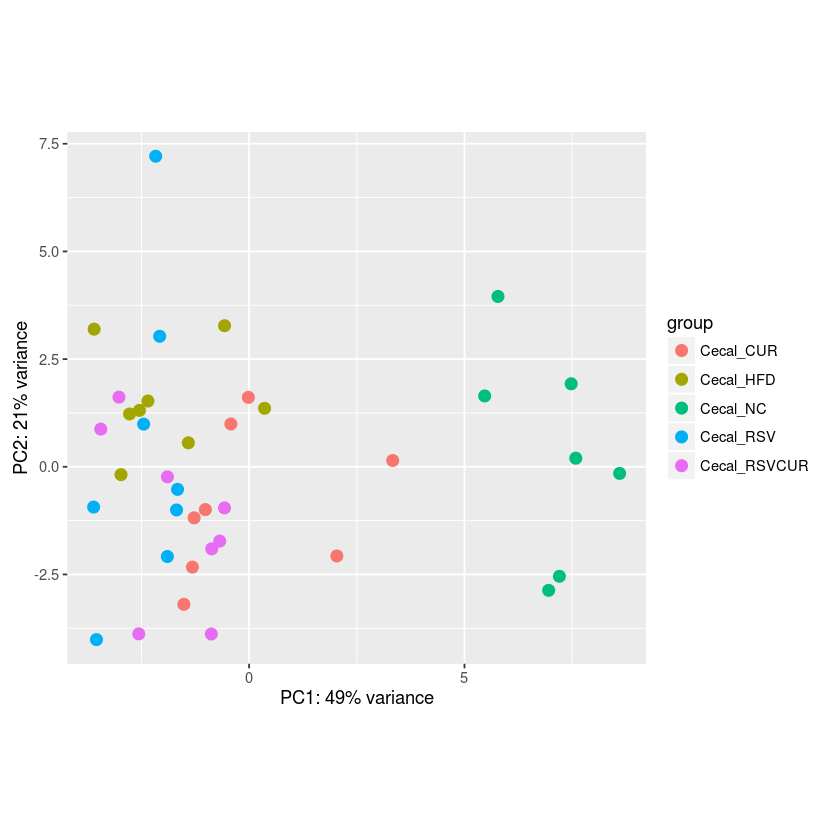

In [48]:
#png("cecaldeseq/images/pca.cecal.png", pointsize=20)
DESeq2::plotPCA(rl.dds2, intgroup=c('Tissue_Gps'), ntop=2522)
#dev.off()